In [19]:
import numpy as np
import botorch
import matplotlib as mpl
import math
import torch
import gpytorch
import blop

from matplotlib import pyplot as plt

from gpytorch.models import ExactGP
from gpytorch.likelihoods import DirichletClassificationLikelihood
from gpytorch.means import ConstantMean
from gpytorch.kernels import ScaleKernel, RBFKernel

from botorch.models.gp_regression import SingleTaskGP
from botorch.models.transforms.input import Normalize
from botorch.models.transforms.outcome import Standardize

from botorch.acquisition import qExpectedImprovement
from botorch.optim import optimize_acqf
from botorch.optim import fit
from botorch.sampling import IIDNormalSampler
from tqdm import tqdm

In [5]:
def generate_beam(dsh=0, ush=0, dsv=0, usv=0, ssa_inboard=-5, ssa_outboard=5, ssa_lower=-5, ssa_upper=5):

    res = 0.1
   
    x = np.arange(-10, 10, 0.1)
    y = np.arange(-10, 10, 0.1)
   
    kx = np.fft.fftfreq(n=len(x), d=0.1)
    ky = np.fft.fftfreq(n=len(y), d=0.1)
   
    X, Y = np.meshgrid(x, y)
    KX, KY = np.meshgrid(kx, ky)

    power_spectrum = 1 / (1e-2 + KX**2 + KY**2)

    white_noise = 5e-3 * np.random.standard_normal(size=X.shape)
    pink_noise = 5e-3 * np.real(np.fft.ifft2(power_spectrum * np.fft.fft2(np.random.standard_normal(size=X.shape))))
    background = 5e-3 * (X - Y) / X.max()
           
    x0 = ush - dsh
    y0 = usv - dsv
   
    x_width = np.sqrt(0.5 + 5e-1 * (ush + dsh - 1) ** 2)
    y_width = np.sqrt(0.25 + 5e-1 * (usv + dsv - 2) ** 2)
   
    beam = np.exp(-0.5 * (((X - x0)/x_width)**4 + ((Y - y0)/y_width)**4)) / (np.sqrt(2 * np.pi) * x_width * y_width)
   
    mask = (X > ssa_inboard) & (X < ssa_outboard) & (Y > ssa_lower) & (Y < ssa_upper)

    return beam * mask + white_noise + pink_noise
   
# QUESTION:  ISN'T FLUX SUM SUPPOSED TO BE 1? 

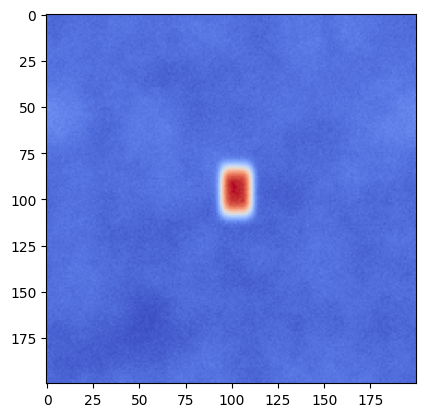

In [387]:
im = generate_beam(0.5, 0.75, 0.5, 0.05)
plt.imshow(im)

In [6]:
def digest_beam(image): 
    flux = image.sum()
    im2 = image
    # Perform SVD
    U, S, Vt = np.linalg.svd(image)

    # Reconstruct the image using the first few singular values
    k = 1  # Number of singular values to use
    reconstructed = np.dot(U[:, :k], np.dot(np.diag(S[:k]), Vt[:k, :]))
    
    column_sums = np.sum(reconstructed, axis = 0)
    row_sums = np.sum(reconstructed, axis = 1)
    
    height_threshold = np.mean(row_sums) + 0.75 * np.std(row_sums)
    
    # Find the indices where the row sums cross the threshold
    above_threshold_h = np.where(row_sums > height_threshold)[0]
    if len(above_threshold_h) > 1:
        start_index_h = above_threshold_h[0]
        end_index_h = above_threshold_h[-1]
        height = end_index_h-start_index_h
        im2 = im2[start_index_h: end_index_h]
    else: 
        height = 1
    
    width_threshold = np.mean(column_sums) + 0.75 * np.std(column_sums)
    above_threshold_w = np.where(column_sums > width_threshold)[0]
    # Find the indices where the column sums cross the threshold
    if len(above_threshold_w) > 1:
        start_index_w = above_threshold_w[0]
        end_index_w = above_threshold_w[-1]
        width = end_index_w-start_index_w
        im2 = im2 [:, start_index_w: end_index_w]
    else: 
        width = 1

    flux = im2.sum() if im2.sum() > 0 else 1
    #return width, height, flux
    return width, height, flux, (end_index_w+start_index_w)/2, (end_index_h+start_index_h)/2
    #return np.log(width), np.log(height), np.log(flux)

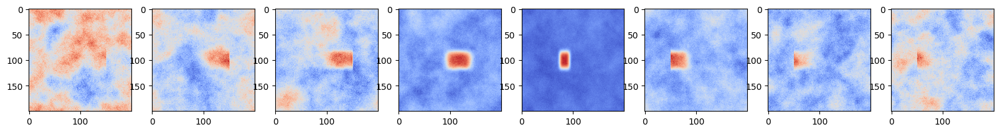

In [14]:
fig, axes = plt.subplots(1, 8, figsize=(20,20), sharex=True)
test_x = np.linspace(-12, 12, 8)
positions = []
widths = []
for i in range(8): 
    im = generate_beam(test_x[i], 0, 0, 0)
    axes[i].imshow(im)

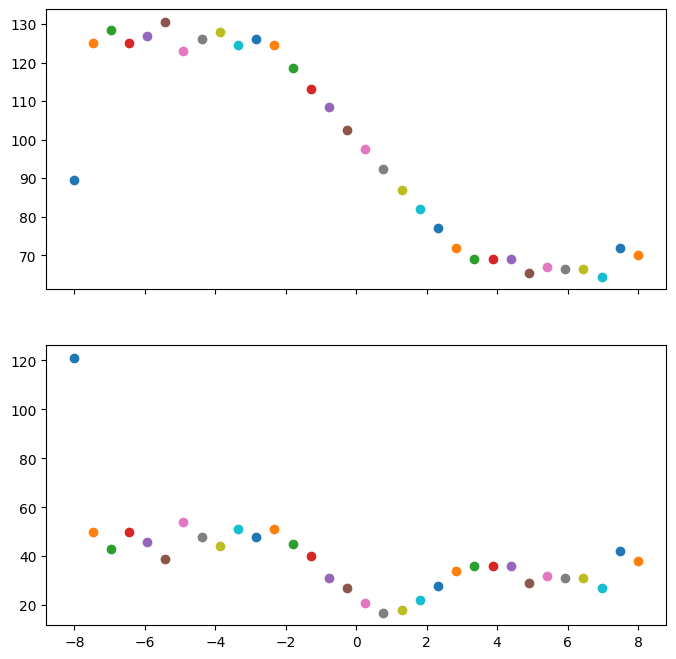

In [44]:
fig, axes = plt.subplots(2, 1, figsize=(8,8), sharex=True)

test_x = np.linspace(-8, 8, 32)
positions = []
widths = []
for x in test_x: 
    im = generate_beam(x, 0, 0, 0)
    w, h, f, x_pos, y_pos= digest_beam(im)
    positions.append(x_pos)
    widths.append(w)
    axes[0].scatter(x, x_pos)
    axes[1].scatter(x, w)


In [45]:
plt.plot(X, width_model.posterior(X).mean.detach())
plt.scatter(X, Y_widths.log())

RuntimeError: The size of tensor a (4) must match the size of tensor b (2) at non-singleton dimension 1

In [729]:
X = torch.tensor(test_x).unsqueeze(-1)
Y_pos = torch.tensor(positions).double().unsqueeze(-1)
Y_widths = torch.tensor(widths).double().unsqueeze(-1)
pos_model = SingleTaskGP(X, Y_pos, input_transform=Normalize(d=1), outcome_transform=Standardize(m=1))
width_model = SingleTaskGP(X, Y_widths.log(), input_transform=Normalize(d=1), outcome_transform=Standardize(m=1))

In [730]:
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(pos_model.likelihood, pos_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))

ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (noise_prior): GammaPrior()
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): SingleTaskGP(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (noise_prior): GammaPrior()
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): ScaleKernel(
      (base_kernel): MaternKernel(
        (lengthscale_prior): GammaPrior()
        (raw_lengthscale_constraint): Positive()
      )
      (outputscale_prior): GammaPrior()
      (raw_outputscale_constraint): Positive()
    )
    (outcome_transform): Standardize()
    (input_transform): Normalize()
  )
)

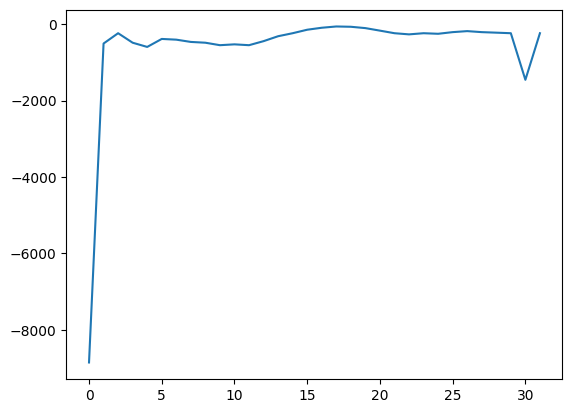

In [731]:
mll = gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model)

mlls = mll(width_model(X), Y_widths).detach()

plt.plot(mlls)

In [737]:
mlls > 2 * np.quantile(mlls, q=0.25)

tensor([False,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
        False,  True])

In [21]:
from blop.bayesian.models import LatentDirichletClassifier

In [3]:
#A GP which minimizes size (width * height) or log(width) + log (height), with a constraint (flux must be >130) enforced by a classifier 
from blop.bayesian.models import LatentDirichletClassifier

num_itr = 60

class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forward(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (6 * torch.rand(size=(20, 4)).double() - 3)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]
Y_fluxes = torch.tensor([(1 if i[2]>130 else 0) for i in digested_images]).long()#.unsqueeze(-1)


good_X = X[Y_fluxes > 0]
Y_sizes = torch.tensor([(-np.log(i[0]*i[1])) for i in digested_images if i[2]>130]).double().unsqueeze(-1)

model = SingleTaskGP(good_X, Y_sizes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
quality_likelihood = DirichletClassificationLikelihood(Y_fluxes, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])

botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(model.likelihood, model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_y = torch.max(Y_sizes)  
    #define bounds
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*6 - 3
    #set constraint function to be mean of posterior of Quality model, which should give us prob. that a point is good
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = model, constraint = constraint, best_f = best_y) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)

    #add selected point to training data for quality model
    X = torch.cat((X, candidate), 0)
    dig_new_image = digest_beam(generate_beam(*np.array(candidate.squeeze())))
    
    y_flux_val = torch.tensor((1 if dig_new_image[2]>130 else 0)).long().unsqueeze(-1)
    Y_fluxes = torch.cat((Y_fluxes, y_flux_val), 0)
    Y_fluxes = Y_fluxes.long()
    if (y_flux_val > 0):
        good_X = torch.cat((good_X, candidate), 0)
        y_size_val = torch.tensor((-1) * np.log(dig_new_image[0] * dig_new_image[1])).unsqueeze(-1)
        Y_sizes = torch.cat((Y_sizes.squeeze(), y_size_val), 0)
        Y_sizes = Y_sizes.double().unsqueeze(dim = -1)

    model = SingleTaskGP(good_X, Y_sizes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    quality_likelihood = DirichletClassificationLikelihood(Y_fluxes, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])

    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(model.likelihood, model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


NameError: name 'qExpectedImprovement' is not defined

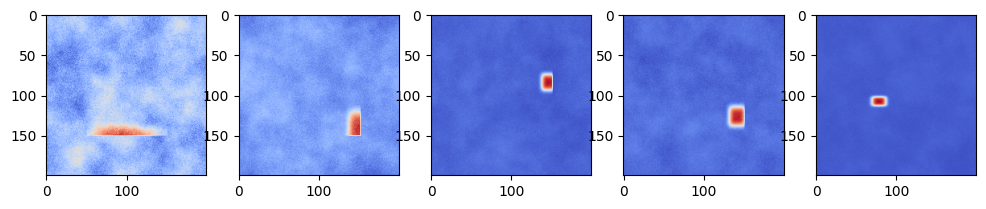

In [617]:
f, axarr = plt.subplots(1,5, figsize=(12, 20))
for i in range(5):
    axarr[i].imshow(generate_beam(*np.array(X[i+75])))  #the last 5 images sampled

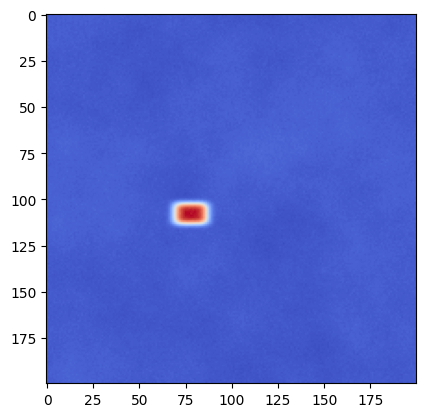

In [618]:
plt.imshow(generate_beam(*np.array(X[23])))  #here is the best that we found

In [662]:
#Same thing as above -- but with separate GP Models for log width, log height.  
#Width only depends on first 2 params, height only on second 2, and "weirdness" depends on all.  
#Also has a classifier for "weirdness" 

num_itr = 60

def is_normal(x): 
    (w, h, f) = x
    return f>130 and w>5 and w<100 and h>5 and h<100

class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forward(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (6 * torch.rand(size=(100, 4)).double() - 3)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]
Quality = torch.tensor([(1 if is_normal(i) else 0) for i in digested_images]).long()#.unsqueeze(-1)

good_X = X[Quality > 0]
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]

Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images if is_normal(i)]).double().unsqueeze(-1)
Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images if is_normal(i)]).double().unsqueeze(-1)
Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images if is_normal(i)]).double().unsqueeze(-1)

width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])

botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_flux = torch.max(Y_fluxes) 
    #define bounds
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*6 - 3
    #set constraint function to be expected quality * expected width * expected height
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()*(width_model.posterior(x.squeeze()[:, 0:2]).mean.detach().squeeze()+height_model.posterior(x.squeeze()[:, 2:]).mean.detach().squeeze()).squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = flux_model, constraint = constraint, best_f = best_flux) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)
    #add selected point to training data for quality model
    X = torch.cat((X, candidate), 0)
    dig_new_image = digest_beam(generate_beam(*np.array(candidate.squeeze())))
    
    y_quality_val = torch.tensor((1 if is_normal(dig_new_image) else 0)).long().unsqueeze(-1)
    Quality = torch.cat((Quality, y_quality_val), 0)
    Quality = Quality.long()
    if (y_quality_val > 0):
        good_X = torch.cat((good_X, candidate), 0)
        good_X_w = torch.cat((good_X_w, candidate[:, 0:2]), 0)
        good_X_h = torch.cat((good_X_h, candidate[:, 2:]), 0) 
        y_width_val = torch.tensor((-1) * np.log(dig_new_image[0])).unsqueeze(-1)
        Y_widths = torch.cat((Y_widths.squeeze(), y_width_val), 0)
        Y_widths = Y_widths.double().unsqueeze(dim = -1)
        y_height_val = torch.tensor((-1) * np.log(dig_new_image[1])).unsqueeze(-1)
        Y_heights = torch.cat((Y_heights.squeeze(), y_height_val), 0)
        Y_heights = Y_heights.double().unsqueeze(dim = -1)
        y_flux_val = torch.tensor((-1) * np.log(dig_new_image[2])).unsqueeze(-1)
        Y_fluxes = torch.cat((Y_fluxes.squeeze(), y_flux_val), 0)
        Y_fluxes = Y_fluxes.double().unsqueeze(dim = -1)
        width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
        height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
        flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
        botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
        botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
        botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
    
    quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


 40%|████████████████████████████████▊                                                 | 24/60 [00:49<01:19,  2.21s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\fit.py:102: OptimizationWarning: `scipy_minimize` terminated with status OptimizationStatus.FAILURE, displaying original message from `scipy.optimize.minimize`: ABNORMAL_TERMINATION_IN_LNSRCH
  warn(
100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [02:13<00:00,  2.22s/it]


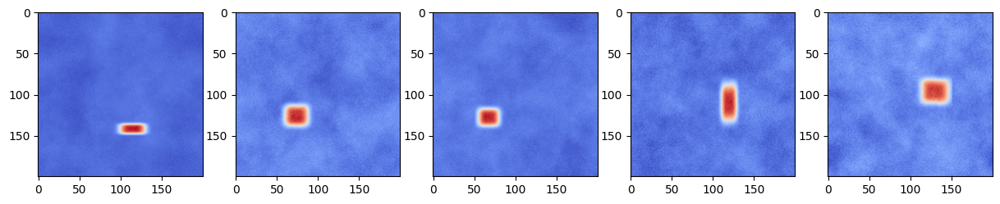

In [671]:
f, axarr = plt.subplots(1,5, figsize=(15, 30))
for i in range(5):
    axarr[i].imshow(generate_beam(*np.array(good_X[i+99])))  #the last 5 images sampled

In [18]:
#Model to create a pareto front for flux and size over the first 4 parameters
import os
from botorch.optim.optimize import optimize_acqf, optimize_acqf_list
from botorch.acquisition.objective import GenericMCObjective
from botorch.utils.multi_objective.scalarization import get_chebyshev_scalarization
from botorch.utils.multi_objective.box_decompositions.non_dominated import (
    FastNondominatedPartitioning,
)
from botorch.acquisition.multi_objective.monte_carlo import (
    qExpectedHypervolumeImprovement,
    qNoisyExpectedHypervolumeImprovement,
)
from botorch.utils.sampling import sample_simplex

from botorch.models.gp_regression import FixedNoiseGP
from botorch.models.model_list_gp_regression import ModelListGP
from botorch.models.transforms.outcome import Standardize
from gpytorch.mlls.sum_marginal_log_likelihood import SumMarginalLogLikelihood
from botorch.utils.transforms import unnormalize, normalize
from botorch.utils.sampling import draw_sobol_samples
SMOKE_TEST = os.environ.get("SMOKE_TEST")
BATCH_SIZE = 4
NUM_RESTARTS = 10 if not SMOKE_TEST else 2
RAW_SAMPLES = 512 if not SMOKE_TEST else 4

standard_bounds = torch.stack([torch.zeros(4), torch.ones(4)])
bounds = torch.stack([torch.zeros(4), torch.ones(4)])*6 - 3

def objectives_fun(x1, x2, x3, x4):
    beams = [digest_beam(generate_beam(x1[i].numpy(), x2[i].numpy(), x3[i].numpy(), x4[i].numpy())) for i in range(x1.size(dim = 0))]
    objs = [[-np.log(width*height), np.log(flux)] for (width, height, flux) in beams]
    return torch.tensor(objs)
    #return torch.stack((np.log(width*height), np.log(flux)), -1)

def generate_initial_data(n=9):
    # generate training data
    train_x = draw_sobol_samples(bounds=bounds, n=n, q=1).double().squeeze(1)
    train_obj_true = objectives_fun(*train_x.T)
    train_obj = train_obj_true #+ torch.randn_like(train_obj_true) * NOISE_SE
    return train_x, train_obj, train_obj_true


def initialize_model(train_x, train_obj):
    # define models for objective and constraint
    train_x = normalize(train_x, bounds)
    models = []
    for i in range(train_obj.shape[-1]):
        train_y = train_obj[..., i : i + 1]
        models.append(
            SingleTaskGP(
                train_x, train_y, outcome_transform=Standardize(m=1)
            )
        )
    model = ModelListGP(*models)
    mll = SumMarginalLogLikelihood(model.likelihood, model)
    return mll, model

In [632]:
ref_point = torch.tensor([-6,4.5]).double()

def optimize_qnehvi_and_get_observation(model, train_x, train_obj, sampler):
    """Optimizes the qEHVI acquisition function, and returns a new candidate and observation."""
    # partition non-dominated space into disjoint rectangles
    acq_func = qNoisyExpectedHypervolumeImprovement(
        model=model,
        ref_point= ref_point.tolist(),  # use known reference point
        X_baseline=normalize(train_x, bounds),
        prune_baseline=True,  # prune baseline points that have estimated zero probability of being Pareto optimal
        sampler=sampler,
    )
    # optimize
    candidates, _ = optimize_acqf(
        acq_function=acq_func,
        bounds=standard_bounds, 
        q=BATCH_SIZE,
        num_restarts=NUM_RESTARTS,
        raw_samples=RAW_SAMPLES,  # used for intialization heuristic
        options={"batch_limit": 5, "maxiter": 200},
        sequential=True,
    )
    # observe new values
    new_x = unnormalize(candidates.detach(), bounds=bounds)
    new_obj_true = objectives_fun(*new_x.T)
    new_obj = new_obj_true #+ torch.randn_like(new_obj_true) * NOISE_SE
    return new_x, new_obj, new_obj_true

In [2]:
import time
import warnings

from botorch import fit_gpytorch_mll
from botorch.exceptions import BadInitialCandidatesWarning
from botorch.sampling.normal import SobolQMCNormalSampler
from botorch.utils.multi_objective.box_decompositions.dominated import (
    DominatedPartitioning,
)
from botorch.utils.multi_objective.pareto import is_non_dominated


warnings.filterwarnings("ignore", category=BadInitialCandidatesWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

N_BATCH = 20 if not SMOKE_TEST else 5
MC_SAMPLES = 128 if not SMOKE_TEST else 16

verbose = True

hvs_qnehvi= []

# call helper functions to generate initial training data and initialize model

train_x_qnehvi, train_obj_qnehvi, train_obj_true_qnehvi = generate_initial_data(
    n=6
)

mll_qnehvi, model_qnehvi = initialize_model(train_x_qnehvi, train_obj_qnehvi)

# compute hypervolume
bd = DominatedPartitioning(ref_point=ref_point, Y=train_obj_true_qnehvi)
volume = bd.compute_hypervolume().item()

hvs_qnehvi.append(volume)

# run N_BATCH rounds of BayesOpt after the initial random batch
for iteration in range(1, N_BATCH + 1):

    t0 = time.monotonic()

    # fit the models
    fit_gpytorch_mll(mll_qnehvi)

    # define the qEI and qNEI acquisition modules using a QMC sampler
    qnehvi_sampler = SobolQMCNormalSampler(sample_shape=torch.Size([MC_SAMPLES]))

    # optimize acquisition functions and get new observations
    (
        new_x_qnehvi,
        new_obj_qnehvi,
        new_obj_true_qnehvi,
    ) = optimize_qnehvi_and_get_observation(
        model_qnehvi, train_x_qnehvi, train_obj_qnehvi, qnehvi_sampler
    )

    # update training points

    train_x_qnehvi = torch.cat([train_x_qnehvi, new_x_qnehvi])
    train_obj_qnehvi = torch.cat([train_obj_qnehvi, new_obj_qnehvi])
    train_obj_true_qnehvi = torch.cat([train_obj_true_qnehvi, new_obj_true_qnehvi])

    # update progress
    for hvs_list, train_obj in zip(
        (hvs_qnehvi,),
        (
            train_obj_true_qnehvi,
        ),
    ):
        # compute hypervolume
        bd = DominatedPartitioning(ref_point=ref_point, Y=train_obj)
        volume = bd.compute_hypervolume().item()
        hvs_list.append(volume)

    # reinitialize the models so they are ready for fitting on next iteration
    # Note: we find improved performance from not warm starting the model hyperparameters
    # using the hyperparameters from the previous iteration
    mll_qnehvi, model_qnehvi = initialize_model(train_x_qnehvi, train_obj_qnehvi)

    t1 = time.monotonic()

    if verbose:
        print(
            f"\nBatch {iteration:>2}: Hypervolume qNEHVI = "
             f"({hvs_qnehvi[-1]:>4.2f}), "
            f"time = {t1-t0:>4.2f}.",
            end="",
        )
    else:
        print(".", end="")

NameError: name 'SMOKE_TEST' is not defined

Text(0.5, 1.0, 'Iteration')

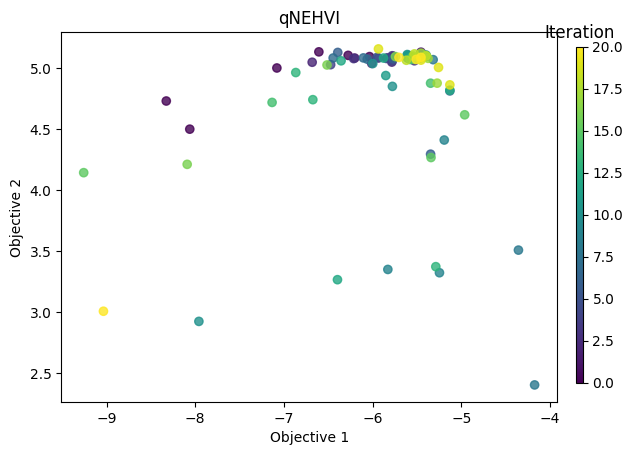

In [634]:
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots()
cm = plt.get_cmap("viridis")

batch_number = torch.cat(
    [
        torch.zeros(2 * (2 + 1)),
        torch.arange(1, N_BATCH + 1).repeat(BATCH_SIZE, 1).t().reshape(-1),
    ]
).numpy()
train_obj=train_obj_true_qnehvi
sc = ax.scatter(
    train_obj[:, 0].cpu().numpy(),
    train_obj[:, 1].cpu().numpy(),
    c=batch_number,
    alpha=0.8,
    cmap = cm
)
ax.set_title("qNEHVI")
ax.set_xlabel("Objective 1")
ax.set_ylabel("Objective 2")
norm = plt.Normalize(batch_number.min(), batch_number.max())
sm = ScalarMappable(norm=norm, cmap=cm)
sm.set_array([])
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.01, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.set_title("Iteration")

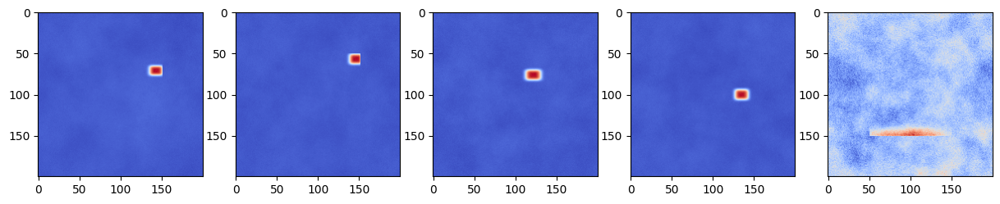

In [636]:
f, axarr = plt.subplots(1,5, figsize=(15, 30))
for i in range(5):
    axarr[i].imshow(generate_beam(*np.array(train_x_qnehvi[i+80])))  #the last 5 images sampled

In [627]:
#Model which optimizes flux density over first 4 parameters

num_itr = 150
flux_density_X = (6 * torch.rand(size=(20, 4)).double() - 3)
images = [generate_beam(*np.array(x)) for x in flux_density_X]
digested_images = [digest_beam(image) for image in images]
Y = torch.tensor([(np.log(i[2])-np.log(i[0]*i[1])) for i in digested_images]).double().unsqueeze(-1)

model = SingleTaskGP(flux_density_X, Y, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(model.likelihood, model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_y = torch.max(Y)  
    #define bounds
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*6 - 3

    acq_fun = qExpectedImprovement(model = model, best_f = best_y) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)

    #add selected point to training data for quality model
    flux_density_X = torch.cat((flux_density_X, candidate), 0)
    dig_new_image = digest_beam(generate_beam(*np.array(candidate.squeeze())))
    y_val = torch.tensor(np.log(dig_new_image[2]) -np.log(dig_new_image[0] * dig_new_image[1])).unsqueeze(-1)
    Y = torch.cat((Y.squeeze(), y_val), 0)
    Y = Y.double().unsqueeze(dim = -1)
    model = SingleTaskGP(flux_density_X, Y, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(model.likelihood, model))


100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [04:43<00:00,  1.89s/it]


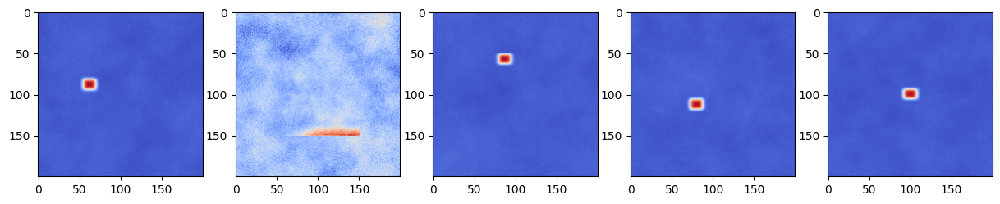

In [628]:
f, axarr = plt.subplots(1,5, figsize=(15, 30))
for i in range(5):
    axarr[i].imshow(generate_beam(*np.array(flux_density_X[i+75])))  #the last 5 images sampled
#GOOD_BEAM_EXAMPLE = np.array(X[23])

In [ ]:
#Model which creates a pareto front of size and flux over last 4 parameters, given a good beam (cutting off just the edges)

In [638]:
bounds = torch.stack([torch.zeros(4), torch.ones(4)])*10 - 5

def objectives_fun(x1, x2, x3, x4):
    beams = [digest_beam(generate_beam(*GOOD_BEAM_EXAMPLE, x1[i].numpy(), x2[i].numpy(), x3[i].numpy(), x4[i].numpy())) for i in range(x1.size(dim = 0))]
    objs = [[-np.log(width*height), np.log(flux)] for (width, height, flux) in beams]
    return torch.tensor(objs)
    #return torch.stack((np.log(width*height), np.log(flux)), -1)

def generate_initial_data(n=9):
    # generate training data
    train_x = draw_sobol_samples(bounds=bounds, n=n, q=1).double().squeeze(1)
    train_obj_true = objectives_fun(*train_x.T)
    train_obj = train_obj_true #+ torch.randn_like(train_obj_true) * NOISE_SE
    return train_x, train_obj, train_obj_true


def initialize_model(train_x, train_obj):
    # define models for objective and constraint
    train_x = normalize(train_x, bounds)
    models = []
    for i in range(train_obj.shape[-1]):
        train_y = train_obj[..., i : i + 1]
        models.append(
            SingleTaskGP(
                train_x, train_y, outcome_transform=Standardize(m=1)
            )
        )
    model = ModelListGP(*models)
    mll = SumMarginalLogLikelihood(model.likelihood, model)
    return mll, model


ref_point = torch.tensor([-6,3]).double()

def optimize_qnehvi_and_get_observation(model, train_x, train_obj, sampler):
    """Optimizes the qEHVI acquisition function, and returns a new candidate and observation."""
    # partition non-dominated space into disjoint rectangles
    acq_func = qNoisyExpectedHypervolumeImprovement(
        model=model,
        ref_point= ref_point.tolist(),  # use known reference point
        X_baseline=normalize(train_x, bounds),
        prune_baseline=True,  # prune baseline points that have estimated zero probability of being Pareto optimal
        sampler=sampler,
    )
    # optimize
    candidates, _ = optimize_acqf(
        acq_function=acq_func,
        bounds=standard_bounds, 
        q=BATCH_SIZE,
        num_restarts=NUM_RESTARTS,
        raw_samples=RAW_SAMPLES,  # used for intialization heuristic
        options={"batch_limit": 5, "maxiter": 200},
        sequential=True,
    )
    # observe new values
    new_x = unnormalize(candidates.detach(), bounds=bounds)
    new_obj_true = objectives_fun(*new_x.T)
    new_obj = new_obj_true #+ torch.randn_like(new_obj_true) * NOISE_SE
    return new_x, new_obj, new_obj_true


hvs_shutters= []

# call helper functions to generate initial training data and initialize model

train_x_shutters, train_obj_shutters, train_obj_true_shutters = generate_initial_data(
    n=16
)

mll_shutters, model_shutters = initialize_model(train_x_shutters, train_obj_shutters)

# compute hypervolume
bd = DominatedPartitioning(ref_point=ref_point, Y=train_obj_true_shutters)
volume = bd.compute_hypervolume().item()

hvs_shutters.append(volume)

# run N_BATCH rounds of BayesOpt after the initial random batch
for iteration in range(1, N_BATCH + 1):

    t0 = time.monotonic()

    # fit the models
    fit_gpytorch_mll(mll_shutters)

    # define the qEI and qNEI acquisition modules using a QMC sampler
    qnehvi_sampler = SobolQMCNormalSampler(sample_shape=torch.Size([MC_SAMPLES]))

    # optimize acquisition functions and get new observations
    (
        new_x_shutters,
        new_obj_shutters,
        new_obj_true_shutters,
    ) = optimize_qnehvi_and_get_observation(
        model_shutters, train_x_shutters, train_obj_shutters, qnehvi_sampler
    )

    # update training points

    train_x_shutters = torch.cat([train_x_shutters, new_x_shutters])
    train_obj_shutters = torch.cat([train_obj_shutters, new_obj_shutters])
    train_obj_true_shutters = torch.cat([train_obj_true_shutters, new_obj_true_shutters])

    # update progress
    for hvs_list, train_obj in zip(
        (hvs_shutters,),
        (
            train_obj_true_shutters,
        ),
    ):
        # compute hypervolume
        bd = DominatedPartitioning(ref_point=ref_point, Y=train_obj)
        volume = bd.compute_hypervolume().item()
        hvs_list.append(volume)

    # reinitialize the models so they are ready for fitting on next iteration
    # Note: we find improved performance from not warm starting the model hyperparameters
    # using the hyperparameters from the previous iteration
    mll_shutters, model_shutters = initialize_model(train_x_shutters, train_obj_shutters)

    t1 = time.monotonic()

    if verbose:
        print(
            f"\nBatch {iteration:>2}: Hypervolume qNEHVI = "
             f"({hvs_shutters[-1]:>4.2f}), "
            f"time = {t1-t0:>4.2f}.",
            end="",
        )
    else:
        print(".", end="")


Batch  1: Hypervolume qNEHVI = (2.42), time = 15.69.
Batch  2: Hypervolume qNEHVI = (2.47), time = 26.73.
Batch  3: Hypervolume qNEHVI = (3.09), time = 34.69.
Batch  4: Hypervolume qNEHVI = (3.17), time = 44.11.
Batch  5: Hypervolume qNEHVI = (3.21), time = 34.66.
Batch  6: Hypervolume qNEHVI = (3.22), time = 35.84.
Batch  7: Hypervolume qNEHVI = (3.23), time = 29.39.
Batch  8: Hypervolume qNEHVI = (3.30), time = 30.30.
Batch  9: Hypervolume qNEHVI = (3.30), time = 33.51.
Batch 10: Hypervolume qNEHVI = (3.30), time = 37.11.
Batch 11: Hypervolume qNEHVI = (3.30), time = 39.58.
Batch 12: Hypervolume qNEHVI = (3.30), time = 37.31.
Batch 13: Hypervolume qNEHVI = (3.30), time = 33.62.
Batch 14: Hypervolume qNEHVI = (3.31), time = 41.66.
Batch 15: Hypervolume qNEHVI = (3.31), time = 33.80.
Batch 16: Hypervolume qNEHVI = (3.31), time = 41.26.
Batch 17: Hypervolume qNEHVI = (3.31), time = 42.45.
Batch 18: Hypervolume qNEHVI = (3.31), time = 40.89.
Batch 19: Hypervolume qNEHVI = (3.31), time =

Text(0.5, 1.0, 'Iteration')

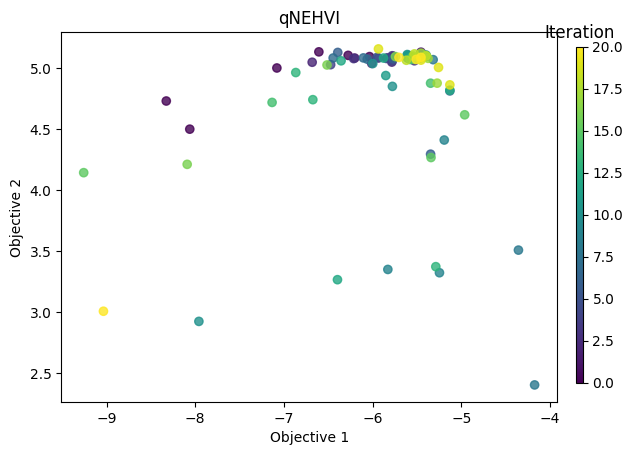

In [639]:
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots()
cm = plt.get_cmap("viridis")

batch_number = torch.cat(
    [
        torch.zeros(2 * (2 + 1)),
        torch.arange(1, N_BATCH + 1).repeat(BATCH_SIZE, 1).t().reshape(-1),
    ]
).numpy()
train_obj=train_obj_true_qnehvi
sc = ax.scatter(
    train_obj[:, 0].cpu().numpy(),
    train_obj[:, 1].cpu().numpy(),
    c=batch_number,
    alpha=0.8,
    cmap = cm
)
ax.set_title("qNEHVI")
ax.set_xlabel("Objective 1")
ax.set_ylabel("Objective 2")
norm = plt.Normalize(batch_number.min(), batch_number.max())
sm = ScalarMappable(norm=norm, cmap=cm)
sm.set_array([])
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.01, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.set_title("Iteration")

In [515]:
train_x_shutters[85]

tensor([-3.3801, -1.2406, -1.7220,  0.4373], dtype=torch.float64)

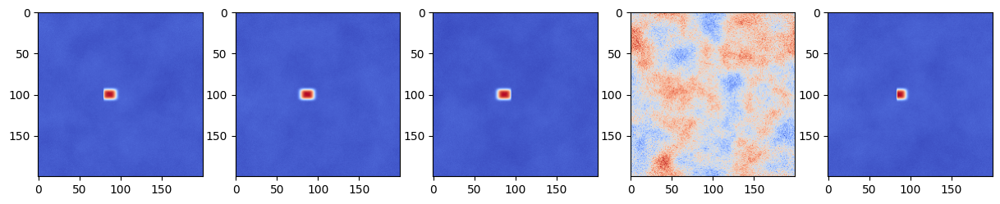

In [644]:
f, axarr = plt.subplots(1,5, figsize=(15, 30))
for i in range(5):
    axarr[i].imshow(generate_beam(*GOOD_BEAM_EXAMPLE, *np.array(train_x_shutters[i+91])))

In [682]:
#Same thing as above -- but with separate GP Models for log width, log height.  
#Width only depends on first 2 params, height only on second 2, and "weirdness" depends on all.  
#Also has a classifier for "weirdness" 

num_itr = 60

def is_normal(x, flux_thresh): 
    (w, h, f) = x
    return f>flux_thresh and w>5 and w<100 and h>5 and h<100

class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forward(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (6 * torch.rand(size=(100, 4)).double() - 3)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]
all_fluxes = [i[2] for i in digested_images]
flux_thresh =np.mean(all_fluxes) - 0.5*np.std(all_fluxes)

Quality = torch.tensor([(1 if is_normal(i, flux_thresh) else 0) for i in digested_images]).long()#.unsqueeze(-1)

good_X = X[Quality > 0]
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]

Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)
Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)
Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)



width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])

botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_flux = torch.max(Y_fluxes) 
    #define bounds
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*6 - 3
    #set constraint function to be expected quality * expected width * expected height
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()*(width_model.posterior(x.squeeze()[:, 0:2]).mean.detach().squeeze()+height_model.posterior(x.squeeze()[:, 2:]).mean.detach().squeeze()).squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = flux_model, constraint = constraint, best_f = best_flux) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)
    #add selected point to training data for quality model
    #NOTE: DEFINITELY NOT THE MOST EFFICIENT WAY TO DO THIS: WE ARE REDOING A TON OF COMPUTATIONS
    #THIS IS JUST TO SEE WHAT RESULTS LOOK LIKE
    X = torch.cat((X, candidate), 0)
    images = [generate_beam(*np.array(x)) for x in X]
    digested_images = [digest_beam(image) for image in images]
    all_fluxes = [i[2] for i in digested_images]
    flux_thresh =np.mean(all_fluxes) - 0.5*np.std(all_fluxes)
    
    Quality = torch.tensor([(1 if is_normal(i, flux_thresh) else 0) for i in digested_images]).long()#.unsqueeze(-1)
    
    good_X = X[Quality > 0]
    good_X_w = good_X[:, 0:2]
    good_X_h = good_X[:, 2:]
    
    Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)
    Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)
    Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images if is_normal(i, flux_thresh)]).double().unsqueeze(-1)

    width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
    
    quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


 42%|██████████████████████████████████▏                                               | 25/60 [04:00<06:11, 10.60s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\fit.py:102: OptimizationWarning: `scipy_minimize` terminated with status OptimizationStatus.FAILURE, displaying original message from `scipy.optimize.minimize`: ABNORMAL_TERMINATION_IN_LNSRCH
  warn(
 65%|█████████████████████████████████████████████████████▎                            | 39/60 [06:37<04:05, 11.67s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\fit.py:102: OptimizationWarning: `scipy_minimize` terminated with status OptimizationStatus.FAILURE, displaying original message from `scipy.optimize.minimize`: ABNORMAL_TERMINATION_IN_LNSRCH
  warn(
 67%|██████████████████████████████████████████████████████▋                           | 40/60 [06:51<04:04, 12.23s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\fit.py:102: OptimizationWarning: `scipy

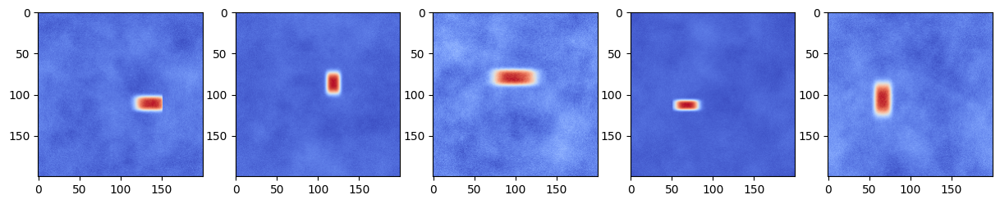

In [690]:
f, axarr = plt.subplots(1,5, figsize=(15, 30))
for i in range(5):
    axarr[i].imshow(generate_beam(*np.array(good_X[i+112])))

In [692]:
%time digest_beam(generate_beam(0.25, 0.25, 0.25))

CPU times: total: 109 ms
Wall time: 211 ms


(20, 31, 155.9703254856722)

In [274]:
#Model to maximize flux and minimzie size, with separate GP Models for log width, log height.  
#Width only depends on first 2 params, height only on second 2, and "weirdness" depends on all.  
#Also has a classifier for "weirdness" -- dynamically trims points which are bad 

#taking a ton of iterations -- may benefit from priors on certain dimensions 

num_itr = 60

def is_normal(good_X, good_X_idx): 
    w_mll = gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model)
    w_mlls = w_mll(width_model(good_X[:, 0:2]), Y_widths).detach()
    h_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model)
    h_mlls = h_mll(height_model(good_X[:, 2:]), Y_heights).detach()
    x_mll = gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model)
    x_mlls = x_mll(xpos_model(good_X[:, 0:2]), Y_xpos).detach()
    y_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, ypos_model)
    y_mlls = y_mll(ypos_model(good_X[:, 2:]), Y_ypos).detach()
    f_mll = gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model)
    f_mlls = f_mll(flux_model(good_X), Y_fluxes).detach()
    mask = ((Y_fluxes.squeeze() > Y_fluxes.max()*0.75) 
            & (w_mlls > 1.35 * np.quantile(w_mlls, q=0.25)) 
            & (h_mlls > 1.35 * np.quantile(h_mlls, q=0.25)) 
            & (x_mlls > 1.2 * np.quantile(x_mlls, q=0.25)) 
            & (y_mlls > 1.2 * np.quantile(y_mlls, q=0.25)) 
            & (f_mlls > 1.2 * np.quantile(f_mlls, q=0.25)))
    new_good_X_idx = torch.tensor([x[0] for x in zip(good_X_idx, good_X)])[mask].tolist()
    new_good_X = good_X[mask]
    new_widths = Y_widths[mask]
    new_heights = Y_heights[mask]
    new_fluxes = Y_fluxes[mask]
    new_xpos = Y_xpos[mask]
    new_ypos = Y_ypos[mask]
    return new_good_X, new_widths, new_heights, new_fluxes, new_xpos, new_ypos, new_good_X_idx
    
class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forwqard(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (14 * torch.rand(size=(256, 4)).double() - 7)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]

good_X = X
good_X_idx = [i for i in range(X.shape[0])]
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]

Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images]).double().unsqueeze(-1)
Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images]).double().unsqueeze(-1)
Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images]).double().unsqueeze(-1)

#Create models of x and y pos -- used only for identifying discontinuities
Y_xpos = torch.tensor([(i[3]) for i in digested_images]).double().unsqueeze(-1)
Y_ypos = torch.tensor([(i[4]) for i in digested_images]).double().unsqueeze(-1)
xpos_model = SingleTaskGP(good_X_w, Y_xpos, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
ypos_model = SingleTaskGP(good_X_h, Y_ypos, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))


width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

# Do an initial fitting of width and height, and positions so we can prune the bad points
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(ypos_model.likelihood, ypos_model))

#prune the bad points
good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X, good_X_idx)
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]
Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()

#Redefine models and refit, with bad points pruned 
width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))

quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_flux = torch.max(Y_fluxes) 
    #define bounds (we make them larger here to test on "worse" beams
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*16 - 8
    #set constraint function to be expected quality * expected width * expected height
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()*(width_model.posterior(x.squeeze()[:, 0:2]).mean.detach().squeeze()+height_model.posterior(x.squeeze()[:, 2:]).mean.detach().squeeze()).exp().squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = flux_model, constraint = constraint, best_f = best_flux) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)
    #add selected point to training data for quality model
    X = torch.cat((X, candidate), 0)
    dig_new_image = digest_beam(generate_beam(*np.array(candidate.squeeze())))
    
    y_quality_val = torch.tensor(1).long().unsqueeze(-1)
    Quality = torch.cat((Quality, y_quality_val), 0)
    Quality = Quality.long()
    good_X = torch.cat((good_X, candidate), 0)
    good_X_idx.append(X.shape[0])
    good_X_w = torch.cat((good_X_w, candidate[:, 0:2]), 0)
    good_X_h = torch.cat((good_X_h, candidate[:, 2:]), 0) 
    y_width_val = torch.tensor((-1) * np.log(dig_new_image[0])).unsqueeze(-1)
    Y_widths = torch.cat((Y_widths.squeeze(), y_width_val), 0)
    Y_widths = Y_widths.double().unsqueeze(dim = -1)
    y_height_val = torch.tensor((-1) * np.log(dig_new_image[1])).unsqueeze(-1)
    Y_heights = torch.cat((Y_heights.squeeze(), y_height_val), 0)
    Y_heights = Y_heights.double().unsqueeze(dim = -1)
    y_flux_val = torch.tensor(np.log(dig_new_image[2])).unsqueeze(-1)
    Y_fluxes = torch.cat((Y_fluxes.squeeze(), y_flux_val), 0)
    Y_fluxes = Y_fluxes.double().unsqueeze(dim = -1)
    y_xpos_val = torch.tensor(dig_new_image[3]).unsqueeze(-1)
    Y_xpos = torch.cat((Y_xpos.squeeze(), y_xpos_val), 0)
    Y_xpos = Y_xpos.double().unsqueeze(dim = -1)
    y_ypos_val = torch.tensor(dig_new_image[4]).unsqueeze(-1)
    Y_ypos = torch.cat((Y_ypos.squeeze(), y_ypos_val), 0)
    Y_ypos = Y_ypos.double().unsqueeze(dim = -1)

    good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X, good_X_idx)
    good_X_w = good_X[:, 0:2]
    good_X_h = good_X[:, 2:]
    Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()
    
    width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
    
    quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [05:29<00:00,  5.50s/it]


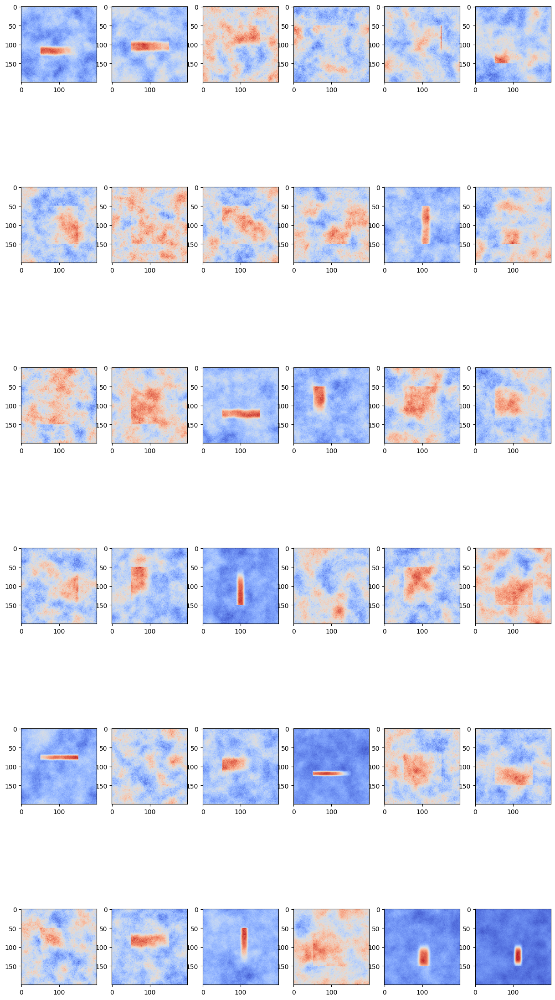

In [277]:
f, axarr = plt.subplots(6,6, figsize=(15, 30))
for i in range(6):
    for j in range(6):
        axarr[i][j].imshow(generate_beam(*np.array(good_X[i*6+j])))

In [29]:
#AN EDIT ON ABOVE CODE: This version is able to bring points "back"-- the "is_normal" function can return any subset of X, not just good_X

#Model to maximize flux and minimzie size, with separate GP Models for log width, log height.  
#Width only depends on first 2 params, height only on second 2, and "weirdness" depends on all.  
#Also has a classifier for "weirdness" -- dynamically trims points which are bad 

#taking a ton of iterations -- may benefit from priors on certain dimensions 

num_itr = 30

def is_normal(good_X): 
    w_mll = gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model)
    w_mlls = w_mll(width_model(X[:, 0:2]), Y_widths_all).detach()
    h_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model)
    h_mlls = h_mll(height_model(X[:, 2:]), Y_heights_all).detach()
    x_mll = gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model)
    x_mlls = x_mll(xpos_model(X[:, 0:2]), Y_xpos_all).detach()
    y_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, ypos_model)
    y_mlls = y_mll(ypos_model(X[:, 2:]), Y_ypos_all).detach()
    f_mll = gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model)
    f_mlls = f_mll(flux_model(X), Y_fluxes_all).detach()
    mask = ((Y_fluxes_all.squeeze() > Y_fluxes.max()*0.72) 
            & (w_mlls > 1.35 * np.quantile(w_mlls, q=0.25)) 
            & (h_mlls > 1.35 * np.quantile(h_mlls, q=0.25)) 
            & (x_mlls > 1.18 * np.quantile(x_mlls, q=0.25)) 
            & (y_mlls > 1.18 * np.quantile(y_mlls, q=0.25)) 
            & (f_mlls > 1.2 * np.quantile(f_mlls, q=0.25)))
    new_good_X_idx = torch.tensor([x[0] for x in enumerate(X)])[mask].tolist()
    new_good_X = X[mask]
    new_widths = Y_widths_all[mask]
    new_heights = Y_heights_all[mask]
    new_fluxes = Y_fluxes_all[mask]
    new_xpos = Y_xpos_all[mask]
    new_ypos = Y_ypos_all[mask]
    return new_good_X, new_widths, new_heights, new_fluxes, new_xpos, new_ypos, new_good_X_idx
    
class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forward(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (16 * torch.rand(size=(100, 4)).double() - 8)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]

good_X = X
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]

Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images]).double().unsqueeze(-1)
Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images]).double().unsqueeze(-1)
Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images]).double().unsqueeze(-1)

Y_widths_all = Y_widths
Y_heights_all = Y_heights
Y_fluxes_all = Y_fluxes

#Create models of x and y pos -- used only for identifying discontinuities
Y_xpos = torch.tensor([(i[3]) for i in digested_images]).double().unsqueeze(-1)
Y_ypos = torch.tensor([(i[4]) for i in digested_images]).double().unsqueeze(-1)
Y_xpos_all = Y_xpos
Y_ypos_all = Y_ypos
xpos_model = SingleTaskGP(good_X_w, Y_xpos, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
ypos_model = SingleTaskGP(good_X_h, Y_ypos, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))


width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

# Do an initial fitting of width and height, and positions so we can prune the bad points
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(ypos_model.likelihood, ypos_model))

#prune the bad points
good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X)
good_X_w = good_X[:, 0:2]
good_X_h = good_X[:, 2:]
Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()

#Redefine models and refit, with bad points pruned 
width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))

quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_flux = torch.max(Y_fluxes) 
    #define bounds (we make them larger here to test on "worse" beams
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*16 - 8
    #set constraint function to be expected quality * expected width * expected height
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()*(width_model.posterior(x.squeeze()[:, 0:2]).mean.detach().squeeze()+height_model.posterior(x.squeeze()[:, 2:]).mean.detach().squeeze()).exp().squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = flux_model, constraint = constraint, best_f = best_flux) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)
    #add selected point to training data for quality model
    X = torch.cat((X, candidate), 0)
    dig_new_image = digest_beam(generate_beam(*np.array(candidate.squeeze())))
    
    y_quality_val = torch.tensor(1).long().unsqueeze(-1)
    Quality = torch.cat((Quality, y_quality_val), 0)
    Quality = Quality.long()
    y_width_val = torch.tensor((-1) * np.log(dig_new_image[0])).unsqueeze(-1)
    Y_widths_all = torch.cat((Y_widths_all.squeeze(), y_width_val), 0)
    Y_widths_all = Y_widths_all.double().unsqueeze(dim = -1)
    y_height_val = torch.tensor((-1) * np.log(dig_new_image[1])).unsqueeze(-1)
    Y_heights_all = torch.cat((Y_heights_all.squeeze(), y_height_val), 0)
    Y_heights_all = Y_heights_all.double().unsqueeze(dim = -1)
    y_flux_val = torch.tensor(np.log(dig_new_image[2])).unsqueeze(-1)
    Y_fluxes_all = torch.cat((Y_fluxes_all.squeeze(), y_flux_val), 0)
    Y_fluxes_all = Y_fluxes_all.double().unsqueeze(dim = -1)
    y_xpos_val = torch.tensor(dig_new_image[3]).unsqueeze(-1)
    Y_xpos_all = torch.cat((Y_xpos_all.squeeze(), y_xpos_val), 0)
    Y_xpos_all = Y_xpos_all.double().unsqueeze(dim = -1)
    y_ypos_val = torch.tensor(dig_new_image[4]).unsqueeze(-1)
    Y_ypos_all = torch.cat((Y_ypos_all.squeeze(), y_ypos_val), 0)
    Y_ypos_all = Y_ypos_all.double().unsqueeze(dim = -1)

    good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X)
    good_X_w = good_X[:, 0:2]
    good_X_h = good_X[:, 2:]
    Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()
    
    width_model = SingleTaskGP(good_X_w, Y_widths, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    height_model = SingleTaskGP(good_X_h, Y_heights, input_transform=Normalize(d=2), outcome_transform=Standardize(m=1))
    flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
    
    quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:46<00:00,  1.55s/it]


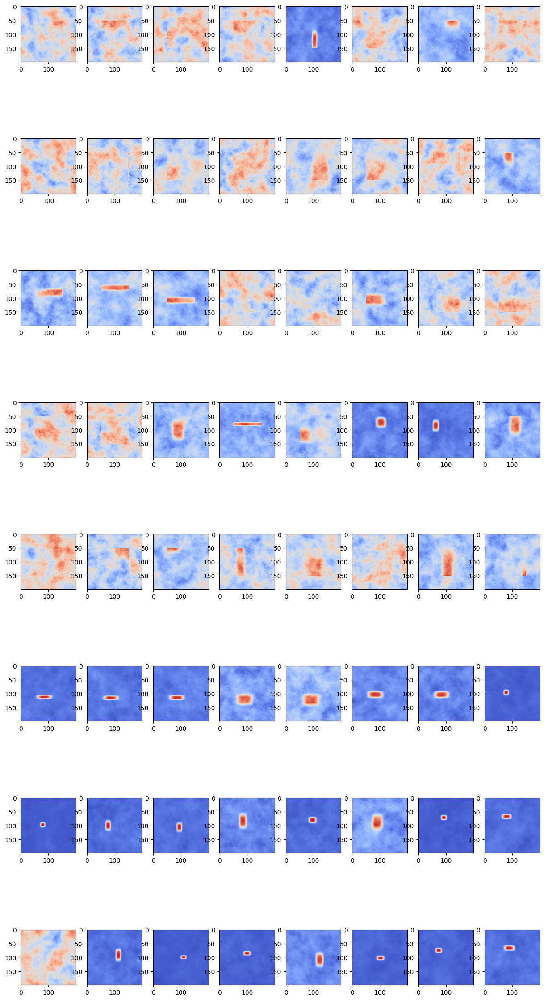

In [291]:
f, axarr = plt.subplots(8,8, figsize=(15, 30))
for i in range(8):
    for j in range(8):
        axarr[i][j].imshow(generate_beam(*np.array(good_X[i*8+j])))

In [203]:
x=torch.tensor([[0.25, 0.25, 0.25, 0.25], [0.25, 0.25, 0.25, 0.25]])
quality_model.probabilities(torch.tensor([[0.25, 0.25, 0.25, 0.25], [0.25, 0.25, 0.25, 0.25]]))[..., -1].squeeze()
(width_model.posterior(x.squeeze()[:, 0:2]).mean.detach().squeeze()+height_model.posterior(x.squeeze()[:, 2:]).mean.detach().squeeze()).squeeze()

tensor([-8.2639, -8.2639], dtype=torch.float64)

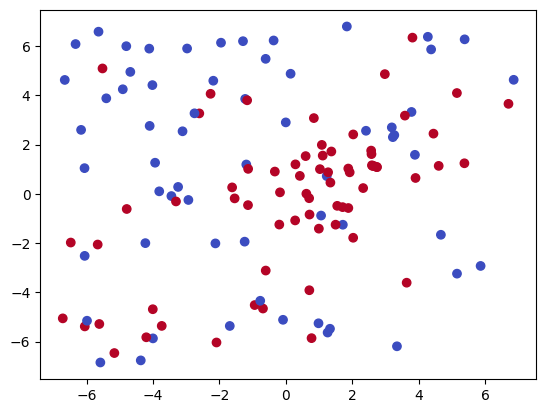

In [294]:
plt.scatter(*X[:, 0:2].T, c=Quality)

tensor(0)
tensor(0)
tensor(0)
tensor(0)
tensor(1)
tensor(1)
tensor(0)
tensor(0)


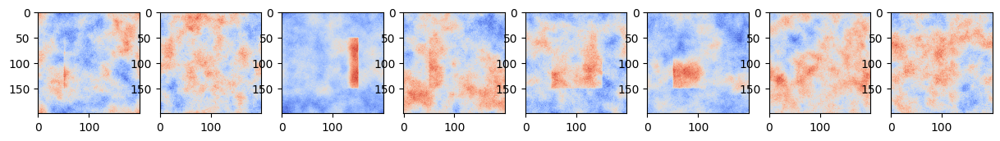

In [354]:
f, axarr = plt.subplots(1,8, figsize=(15, 30))
for i in range(8):
    axarr[i].imshow(images[i+50])
    print(Quality[i+50])

tensor(0)

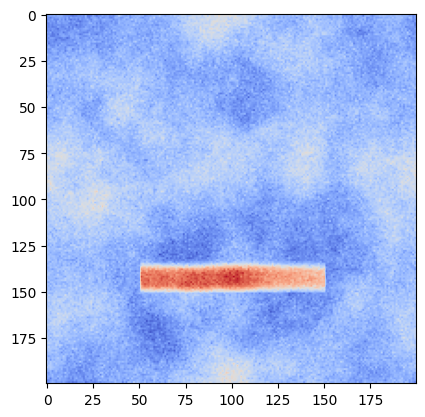

In [310]:
plt.imshow(images[2])
digested_images[2]
Quality[2]

In [320]:
width_model.posterior(X[2, 0:2]).mean.detach()

tensor([[-3.9648]], dtype=torch.float64)

In [23]:
#ANOTHER EDIT: this trains all models in all 4 dimensions. 
#AN EDIT ON ABOVE CODE: This version is able to bring points "back"-- the "is_normal" function can return any subset of X, not just good_X

#Model to maximize flux and minimzie size, with separate GP Models for log width, log height.  
#Width only depends on first 2 params, height only on second 2, and "weirdness" depends on all.  
#Also has a classifier for "weirdness" -- dynamically trims points which are bad 

#taking a ton of iterations -- may benefit from priors on certain dimensions 

num_itr = 60

def is_normal(good_X): 
    w_mll = gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model)
    w_mlls = w_mll(width_model(X), Y_widths_all).detach()
    h_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model)
    h_mlls = h_mll(height_model(X), Y_heights_all).detach()
    x_mll = gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model)
    x_mlls = x_mll(xpos_model(X), Y_xpos_all).detach()
    y_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, ypos_model)
    y_mlls = y_mll(ypos_model(X), Y_ypos_all).detach()
    # f_mll = gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model)
    # f_mlls = f_mll(flux_model(X), Y_fluxes_all).detach()
    mask = (((Y_fluxes_all.squeeze() > Y_fluxes.max()*0.7).long() 
                + (w_mlls > 1.2 * np.quantile(w_mlls, q=0.25)).long() 
                + (h_mlls > 1.2 * np.quantile(h_mlls, q=0.25)).long() 
                +(x_mlls > 1.15 * np.quantile(x_mlls, q=0.25)).long() 
                + (y_mlls > 1.15 * np.quantile(y_mlls, q=0.25)).long() 
                #+ (f_mlls > 1.2 * np.quantile(f_mlls, q=0.25)).long()
               ) > 4)
    new_good_X_idx = torch.tensor([x[0] for x in enumerate(X)])[mask].tolist()
    new_good_X = X[mask]
    new_widths = Y_widths_all[mask]
    new_heights = Y_heights_all[mask]
    new_fluxes = Y_fluxes_all[mask]
    new_xpos = Y_xpos_all[mask]
    new_ypos = Y_ypos_all[mask]
    return new_good_X, new_widths, new_heights, new_fluxes, new_xpos, new_ypos, new_good_X_idx
    
class ConstrainedQExpectedImprovement(qExpectedImprovement):
    def __init__(self, model, constraint, **kwargs):
        super().__init__(model=model, **kwargs)
        self.constraint = constraint

    def forward(self, x):
        return super().forward(x) * self.constraint(x).squeeze()

X = (16 * torch.rand(size=(128, 4)).double() - 8)
images = [generate_beam(*np.array(x)) for x in X]
digested_images = [digest_beam(image) for image in images]

good_X = X

Y_widths = torch.tensor([(-np.log(i[0])) for i in digested_images]).double().unsqueeze(-1)
Y_heights = torch.tensor([(-np.log(i[1])) for i in digested_images]).double().unsqueeze(-1)
Y_fluxes = torch.tensor([(np.log(i[2])) for i in digested_images]).double().unsqueeze(-1)

Y_widths_all = Y_widths
Y_heights_all = Y_heights
Y_fluxes_all = Y_fluxes

#Create models of x and y pos -- used only for identifying discontinuities
Y_xpos = torch.tensor([(i[3]) for i in digested_images]).double().unsqueeze(-1)
Y_ypos = torch.tensor([(i[4]) for i in digested_images]).double().unsqueeze(-1)
Y_xpos_all = Y_xpos
Y_ypos_all = Y_ypos
xpos_model = SingleTaskGP(good_X, Y_xpos, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
ypos_model = SingleTaskGP(good_X, Y_ypos, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))


width_model = SingleTaskGP(good_X, Y_widths, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X, Y_heights, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))

# Do an initial fitting of width and height, and positions so we can prune the bad points
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(ypos_model.likelihood, ypos_model))

#prune the bad points
good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X)

Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()

#Redefine models and refit, with bad points pruned 
width_model = SingleTaskGP(good_X, Y_widths, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
height_model = SingleTaskGP(good_X, Y_heights, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))

quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))

for i in tqdm(range(num_itr)):
    #set best_y to the best value of the function we have achieved
    best_flux = torch.max(Y_fluxes) 
    #define bounds (we make them larger here to test on "worse" beams
    bounds = torch.stack([torch.zeros(4), torch.ones(4)])*16 - 8
    #set constraint function to be expected quality * expected width * expected height
    def constraint(x):
        return quality_model.probabilities(x)[..., -1].squeeze()*(width_model.posterior(x.squeeze()).mean.detach().squeeze()+height_model.posterior(x.squeeze()).mean.detach().squeeze()).exp().squeeze()

    acq_fun = ConstrainedQExpectedImprovement(model = flux_model, constraint = constraint, best_f = best_flux) 
    #optimize aquisition function
    candidate, acq_value = optimize_acqf(acq_fun, bounds = bounds, q=1, num_restarts=5, raw_samples = 10)
    #add selected point to training data for quality model
    X = torch.cat((X, candidate), 0)
    new_image = generate_beam(*np.array(candidate.squeeze()))
    dig_new_image = digest_beam(new_image)
    images.append(new_image)
    y_quality_val = torch.tensor(1).long().unsqueeze(-1)
    Quality = torch.cat((Quality, y_quality_val), 0)
    Quality = Quality.long()
    y_width_val = torch.tensor((-1) * np.log(dig_new_image[0])).unsqueeze(-1)
    Y_widths_all = torch.cat((Y_widths_all.squeeze(), y_width_val), 0)
    Y_widths_all = Y_widths_all.double().unsqueeze(dim = -1)
    y_height_val = torch.tensor((-1) * np.log(dig_new_image[1])).unsqueeze(-1)
    Y_heights_all = torch.cat((Y_heights_all.squeeze(), y_height_val), 0)
    Y_heights_all = Y_heights_all.double().unsqueeze(dim = -1)
    y_flux_val = torch.tensor(np.log(dig_new_image[2])).unsqueeze(-1)
    Y_fluxes_all = torch.cat((Y_fluxes_all.squeeze(), y_flux_val), 0)
    Y_fluxes_all = Y_fluxes_all.double().unsqueeze(dim = -1)
    y_xpos_val = torch.tensor(dig_new_image[3]).unsqueeze(-1)
    Y_xpos_all = torch.cat((Y_xpos_all.squeeze(), y_xpos_val), 0)
    Y_xpos_all = Y_xpos_all.double().unsqueeze(dim = -1)
    y_ypos_val = torch.tensor(dig_new_image[4]).unsqueeze(-1)
    Y_ypos_all = torch.cat((Y_ypos_all.squeeze(), y_ypos_val), 0)
    Y_ypos_all = Y_ypos_all.double().unsqueeze(dim = -1)

    good_X, Y_widths, Y_heights, Y_fluxes, Y_xpos, Y_ypos, good_X_idx = is_normal(good_X)
    Quality = torch.tensor([(1 if (x[0] in good_X_idx) else 0) for x in enumerate(X)]).long()

    if i%3==0: 
        xpos_model = SingleTaskGP(good_X, Y_xpos, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
        ypos_model = SingleTaskGP(good_X, Y_ypos, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
        botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model))
        botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(ypos_model.likelihood, ypos_model))
    width_model = SingleTaskGP(good_X, Y_widths, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    height_model = SingleTaskGP(good_X, Y_heights, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    flux_model = SingleTaskGP(good_X, Y_fluxes, input_transform=Normalize(d=4), outcome_transform=Standardize(m=1))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model))
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model))
    quality_likelihood = DirichletClassificationLikelihood(Quality, learn_additional_noise=True).double()
    quality_model = LatentDirichletClassifier(train_inputs = X, train_targets = quality_likelihood.transformed_targets.transpose(-1, -2).double(), likelihood = quality_likelihood, skew_dims =[(0,), (1,), (2,), (3,)])
    botorch.fit.fit_gpytorch_mll(gpytorch.mlls.ExactMarginalLogLikelihood(quality_model.likelihood, quality_model))


  0%|                                                                                           | 0/60 [00:00<?, ?it/s]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\initializers.py:432: BadInitialCandidatesWarning: Unable to find non-zero acquisition function values - initial conditions are being selected randomly.
  warnings.warn(
  3%|██▊                                                                                | 2/60 [00:03<01:46,  1.84s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\initializers.py:432: BadInitialCandidatesWarning: Unable to find non-zero acquisition function values - initial conditions are being selected randomly.
  warnings.warn(
  7%|█████▌                                                                             | 4/60 [00:07<01:50,  1.97s/it]C:\Users\megha\Anaconda3\envs\nsls2\Lib\site-packages\botorch\optim\initializers.py:432: BadInitialCandidatesWarning: Unable to find non-zero acquisition function values

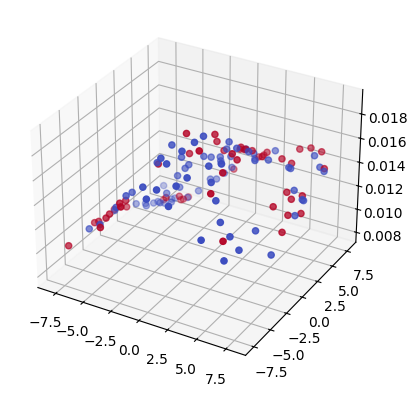

In [42]:
fig = plt.figure()
ax = plt.axes(projection='3d')

zdata = width_model.posterior(X[:, 0:2]).mean.detach().squeeze().exp()
xdata = X[:, 0]
ydata = X[:, 1]
ax.scatter3D(xdata, ydata, zdata, c=Quality);

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')

zdata = width_model.posterior(X[:, 0:2]).mean.detach().squeeze()
xdata = X[:, 0]
ydata = X[:, 1]
ax.scatter3D(xdata, ydata, zdata, c=Quality);

In [38]:
zdata

tensor([[-4.2346],
        [-4.3357],
        [-4.0911],
        [-4.7774],
        [-4.5893],
        [-4.3056],
        [-4.3310],
        [-4.5303],
        [-4.7984],
        [-4.4643],
        [-4.1522],
        [-4.1034],
        [-4.2004],
        [-3.9797],
        [-4.2162],
        [-4.2135],
        [-4.8327],
        [-4.1355],
        [-4.0937],
        [-4.2920],
        [-4.0516],
        [-4.7869],
        [-4.2051],
        [-4.2098],
        [-4.4061],
        [-4.1201],
        [-4.0337],
        [-4.2036],
        [-4.0925],
        [-4.5273],
        [-4.1630],
        [-4.2101],
        [-3.9543],
        [-4.3400],
        [-3.9661],
        [-4.3693],
        [-4.2556],
        [-4.6987],
        [-4.5659],
        [-4.3091],
        [-4.1519],
        [-4.3223],
        [-4.3924],
        [-4.4918],
        [-4.0537],
        [-4.2462],
        [-4.2764],
        [-4.4123],
        [-4.0799],
        [-4.3199],
        [-4.0689],
        [-4.2148],
        [-4.

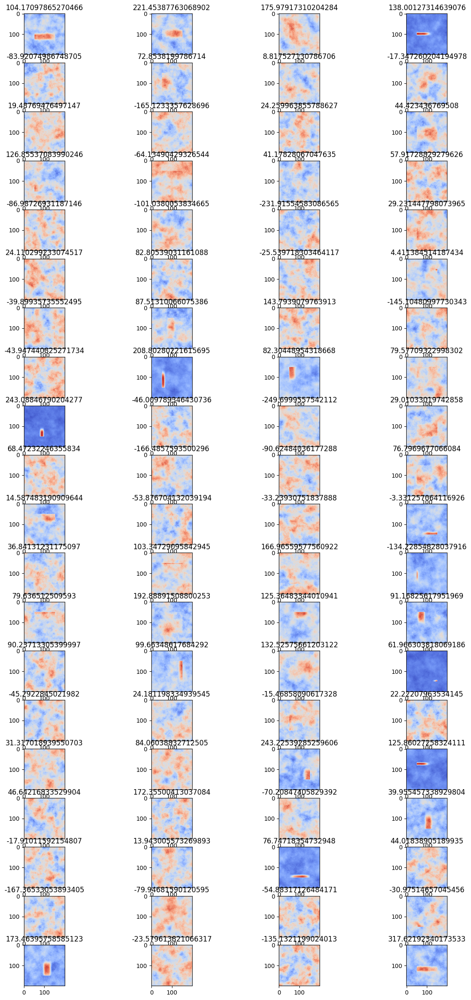

In [493]:
f, axarr = plt.subplots(20,4, figsize=(15, 30))
for i in range(20):
    for j in range(4):
        #axarr[i][j].imshow(([i[1] for i in enumerate(images) if i[0] in good_X_idx])[i*8+j])
        axarr[i][j].imshow(images[i*4+j])
        axarr[i][j].set_title(images[i*4+j].sum())

In [1]:
i=186
plt.imshow(generate_beam(*np.array(X[i])))
Quality[i]

NameError: name 'plt' is not defined

In [489]:
w_mll = gpytorch.mlls.ExactMarginalLogLikelihood(width_model.likelihood, width_model)
w_mlls = w_mll(width_model(X), Y_widths_all).detach()
h_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, height_model)
h_mlls = h_mll(height_model(X), Y_heights_all).detach()
x_mll = gpytorch.mlls.ExactMarginalLogLikelihood(xpos_model.likelihood, xpos_model)
x_mlls = x_mll(xpos_model(X), Y_xpos_all).detach()
y_mll = gpytorch.mlls.ExactMarginalLogLikelihood(height_model.likelihood, ypos_model)
y_mlls = y_mll(ypos_model(X), Y_ypos_all).detach()
f_mll = gpytorch.mlls.ExactMarginalLogLikelihood(flux_model.likelihood, flux_model)
f_mlls = f_mll(flux_model(X), Y_fluxes_all).detach()
mask = (((Y_fluxes_all.squeeze() > Y_fluxes.max()*0.75).long() 
            + (w_mlls > 1.2 * np.quantile(w_mlls, q=0.25)).long() 
            + (h_mlls > 1.2 * np.quantile(h_mlls, q=0.25)).long() 
            +(x_mlls > 1.15 * np.quantile(x_mlls, q=0.25)).long() 
            + (y_mlls > 1.15 * np.quantile(y_mlls, q=0.25)).long() 
            #+ (f_mlls > 1.2 * np.quantile(f_mlls, q=0.25)).long()
           ) ) #> 4)
mask[186]
y_mlls[186]
#np.quantile(y_mlls, q=0.25)

tensor(-8063.7387, dtype=torch.float64)

In [451]:
Y_fluxes_all

tensor([[ 0.0000],
        [ 0.1433],
        [ 3.8243],
        [ 4.2367],
        [ 3.6966],
        [ 3.6900],
        [ 3.2632],
        [ 4.5325],
        [ 3.6110],
        [ 0.0000],
        [ 4.7451],
        [ 4.4083],
        [ 4.2810],
        [ 3.9726],
        [ 3.6239],
        [ 3.9201],
        [ 4.9477],
        [ 0.6865],
        [ 3.9699],
        [ 4.6317],
        [ 3.2063],
        [ 3.6473],
        [ 3.7345],
        [ 0.0000],
        [ 4.5736],
        [ 0.0000],
        [ 4.2478],
        [ 4.8055],
        [ 4.1812],
        [ 4.1169],
        [ 0.0000],
        [ 4.6012],
        [ 4.3718],
        [ 3.6234],
        [ 2.8336],
        [ 3.7823],
        [ 4.3657],
        [ 3.7372],
        [ 3.3482],
        [ 1.8805],
        [ 3.7615],
        [ 3.8401],
        [ 4.8079],
        [ 4.8170],
        [ 3.9893],
        [ 3.2165],
        [ 4.0608],
        [ 4.1685],
        [-0.4275],
        [ 3.0053],
        [ 0.0000],
        [ 0.0000],
        [ 4.

In [15]:
X

NameError: name 'X' is not defined